In [1]:
import pystac
import pandas as pd
import geopandas as gpd
from pystac import MediaType

In [2]:
# s3_catalog_uri = "s3://spatio-temporal-asset-catalog/CorestackCatalogs/catalog.json"
s3_url = 'https://spatio-temporal-asset-catalog.s3.ap-south-1.amazonaws.com/CorestackCatalogs/catalog.json'
# s3_url = 'https://spatio-temporal-asset-catalog.s3.ap-south-1.amazonaws.com/super_catalog.json'
# web_url = 'https://stac.core-stack.org/CorestackCatalogs/catalog.json'
catalog = pystac.Catalog.from_file(s3_url)


In [4]:
# catalog

In [ ]:
print(f"Catalog ID: {catalog.id}")
print(f"Description: {catalog.description}")
# print(f"STAC Version: {catalog.stac_version}")

Catalog ID: corestack_STAC
Description: This spatio temporal asset catalog contains all data layers of CoRE Stack (https://core-stack.org/). The data layers are generated at an administrative tehsil level.


In [5]:
collections = list(catalog.get_collections())

print(f"Number of collections: {len(collections)}")
print("Collections IDs:")
for collection in collections:
    print(f"- {collection.id}")

Number of collections: 21
Collections IDs:
- bihar
- himachal_pradesh
- jharkhand
- odisha
- gujarat
- maharashtra
- telangana
- karnataka
- rajasthan
- delhi
- andhra_pradesh
- goa
- haryana
- tamil_nadu
- madhya_pradesh
- uttar_pradesh
- west_bengal
- chhattisgarh
- meghalaya
- nagaland
- assam


Select **State**

In [6]:
state_collection = catalog.get_child(id='jharkhand') 

In [1]:
# list(state_collection.get_children())

Select **district**

In [9]:
district_catalog = state_collection.get_child(id='dumka')

In [2]:
# list(district_catalog.get_children())

Select **tehsil**

In [11]:
tehsil_catalog = district_catalog.get_child(id='masalia')

Select data within the tehsil

In [3]:
# list(tehsil_catalog.get_all_items())

In [17]:
vector_item = tehsil_catalog.get_item(id='jharkhand_dumka_masalia_cropping_intensity_vector')

In [20]:
vector_item

<Item id=jharkhand_dumka_masalia_cropping_intensity_vector>

In a vector item, link to the data url is under **assets** -> **data**

In [22]:
vector_item.assets['data'].href

'https://geoserver.core-stack.org:8443/geoserver/crop_intensity/ows?service=WFS&version=1.0.0&request=GetFeature&typeName=crop_intensity:dumka_masalia_intensity&outputFormat=application/json'

In [23]:
vector_data_df = gpd.GeoDataFrame.from_file(vector_item.assets['data'].href)

In [25]:
vector_data_df.head()

,area_in_ha,cropping_intensity_2017,cropping_intensity_2018,cropping_intensity_2019,cropping_intensity_2020,cropping_intensity_2021,cropping_intensity_2022,cropping_intensity_2023,cropping_intensity_2024,doubly_cropped_area_2017,...,triply_cropped_area_2017,triply_cropped_area_2018,triply_cropped_area_2019,triply_cropped_area_2020,triply_cropped_area_2021,triply_cropped_area_2022,triply_cropped_area_2023,triply_cropped_area_2024,uid,geometry
0,771.728344,1.543360,1.592989,1.627989,1.579311,1.533926,1.591896,1.749995,1.669949,205.898274,...,7.596099,6.770413,49.767600,6.412422,29.306040,2.696889,69.853958,89.165643,12_305795,"MULTIPOLYGON (((87.20967 24.14415, 87.2094 24...."
1,847.832509,0.933263,1.054730,0.962435,1.038555,0.895486,1.047503,1.513780,1.294424,35.191767,...,9.841107,9.502951,14.673246,8.851680,14.347088,4.029576,28.882271,36.374633,12_344879,"MULTIPOLYGON (((87.24821 24.14469, 87.24821 24..."
2,1528.045314,1.623742,1.490047,2.009765,1.695151,1.675955,1.709405,1.417724,1.634267,519.313048,...,10.387465,2.376741,171.642256,4.199053,6.530095,2.938390,25.846949,72.504461,12_349531,"MULTIPOLYGON (((87.28297 24.09538, 87.28297 24..."
3,1055.627014,1.583523,1.635800,1.932067,1.729595,1.741252,1.646135,1.352155,1.670557,412.844527,...,4.227215,2.579079,103.195653,2.203542,38.080058,1.002135,25.625159,100.586456,12_352646,"MULTIPOLYGON (((87.22072 24.08325, 87.22072 24..."
4,610.230564,1.523093,1.722255,1.763636,1.633273,1.695550,1.650746,1.684141,1.538312,213.185629,...,2.089368,2.519594,17.815055,1.561420,10.238013,0.549859,26.301421,7.409542,12_365593,"MULTIPOLYGON (((87.19404 24.06007, 87.19404 24..."


In [49]:
vector_data_df.columns

Index(['area_in_ha', 'cropping_intensity_2017', 'cropping_intensity_2018',
       'cropping_intensity_2019', 'cropping_intensity_2020',
       'cropping_intensity_2021', 'cropping_intensity_2022',
       'cropping_intensity_2023', 'cropping_intensity_2024',
       'doubly_cropped_area_2017', 'doubly_cropped_area_2018',
       'doubly_cropped_area_2019', 'doubly_cropped_area_2020',
       'doubly_cropped_area_2021', 'doubly_cropped_area_2022',
       'doubly_cropped_area_2023', 'doubly_cropped_area_2024', 'id',
       'single_cropped_area_2017', 'single_cropped_area_2018',
       'single_cropped_area_2019', 'single_cropped_area_2020',
       'single_cropped_area_2021', 'single_cropped_area_2022',
       'single_cropped_area_2023', 'single_cropped_area_2024',
       'single_kharif_cropped_area_2017', 'single_kharif_cropped_area_2018',
       'single_kharif_cropped_area_2019', 'single_kharif_cropped_area_2020',
       'single_kharif_cropped_area_2021', 'single_kharif_cropped_area_2022',
 

In [31]:
vector_data_df.columns[vector_data_df.columns.str.contains('intensity')]

Index(['cropping_intensity_2017', 'cropping_intensity_2018',
       'cropping_intensity_2019', 'cropping_intensity_2020',
       'cropping_intensity_2021', 'cropping_intensity_2022',
       'cropping_intensity_2023', 'cropping_intensity_2024'],
      dtype='object')

In [45]:
vector_data_df.columns[vector_data_df.columns.str.contains('intensity')]

Index(['cropping_intensity_2017', 'cropping_intensity_2018',
       'cropping_intensity_2019', 'cropping_intensity_2020',
       'cropping_intensity_2021', 'cropping_intensity_2022',
       'cropping_intensity_2023', 'cropping_intensity_2024'],
      dtype='object')

In [84]:
filter_columns = vector_data_df.columns[vector_data_df.columns.str.contains('intensity|uid|geometry')]
filter_columns

Index(['cropping_intensity_2017', 'cropping_intensity_2018',
       'cropping_intensity_2019', 'cropping_intensity_2020',
       'cropping_intensity_2021', 'cropping_intensity_2022',
       'cropping_intensity_2023', 'cropping_intensity_2024', 'uid',
       'geometry'],
      dtype='object')

Select a **microwatershed**

In [85]:
vector_data_filtered_df = vector_data_df[filter_columns]

In [86]:
vector_data_filtered_df['uid']

0     12_305795
1     12_344879
2     12_349531
3     12_352646
4     12_365593
        ...    
59    12_354931
60    12_353231
61    12_354480
62    12_368442
63    12_355341
Name: uid, Length: 64, dtype: object

In [90]:
vector_data_mws_df = vector_data_filtered_df[vector_data_filtered_df['uid'] == vector_data_filtered_df['uid'].iloc[0]]
vector_data_mws_df

,cropping_intensity_2017,cropping_intensity_2018,cropping_intensity_2019,cropping_intensity_2020,cropping_intensity_2021,cropping_intensity_2022,cropping_intensity_2023,cropping_intensity_2024,uid,geometry
0,1.54336,1.592989,1.627989,1.579311,1.533926,1.591896,1.749995,1.669949,12_305795,"MULTIPOLYGON (((87.20967 24.14415, 87.2094 24...."


In [91]:
vector_data_mws_df = vector_data_mws_df.melt(id_vars=['uid','geometry'])
vector_data_mws_df

,uid,geometry,variable,value
0,12_305795,"MULTIPOLYGON (((87.20967 24.14415, 87.2094 24....",cropping_intensity_2017,1.543360
1,12_305795,"MULTIPOLYGON (((87.20967 24.14415, 87.2094 24....",cropping_intensity_2018,1.592989
2,12_305795,"MULTIPOLYGON (((87.20967 24.14415, 87.2094 24....",cropping_intensity_2019,1.627989
3,12_305795,"MULTIPOLYGON (((87.20967 24.14415, 87.2094 24....",cropping_intensity_2020,1.579311
4,12_305795,"MULTIPOLYGON (((87.20967 24.14415, 87.2094 24....",cropping_intensity_2021,1.533926
5,12_305795,"MULTIPOLYGON (((87.20967 24.14415, 87.2094 24....",cropping_intensity_2022,1.591896
6,12_305795,"MULTIPOLYGON (((87.20967 24.14415, 87.2094 24....",cropping_intensity_2023,1.749995
7,12_305795,"MULTIPOLYGON (((87.20967 24.14415, 87.2094 24....",cropping_intensity_2024,1.669949


In [92]:
vector_data_mws_df['variable'] = vector_data_mws_df['variable'].apply(lambda x: x.replace('cropping_intensity_',''))

In [93]:
vector_data_mws_df.rename(columns={'variable':'year'},inplace=True)

In [94]:
vector_data_mws_df.rename(columns={'value':'cropping_intensity'},inplace=True)

In [95]:
vector_data_mws_df

,uid,geometry,year,cropping_intensity
0,12_305795,"MULTIPOLYGON (((87.20967 24.14415, 87.2094 24....",2017,1.543360
1,12_305795,"MULTIPOLYGON (((87.20967 24.14415, 87.2094 24....",2018,1.592989
2,12_305795,"MULTIPOLYGON (((87.20967 24.14415, 87.2094 24....",2019,1.627989
3,12_305795,"MULTIPOLYGON (((87.20967 24.14415, 87.2094 24....",2020,1.579311
4,12_305795,"MULTIPOLYGON (((87.20967 24.14415, 87.2094 24....",2021,1.533926
5,12_305795,"MULTIPOLYGON (((87.20967 24.14415, 87.2094 24....",2022,1.591896
6,12_305795,"MULTIPOLYGON (((87.20967 24.14415, 87.2094 24....",2023,1.749995
7,12_305795,"MULTIPOLYGON (((87.20967 24.14415, 87.2094 24....",2024,1.669949


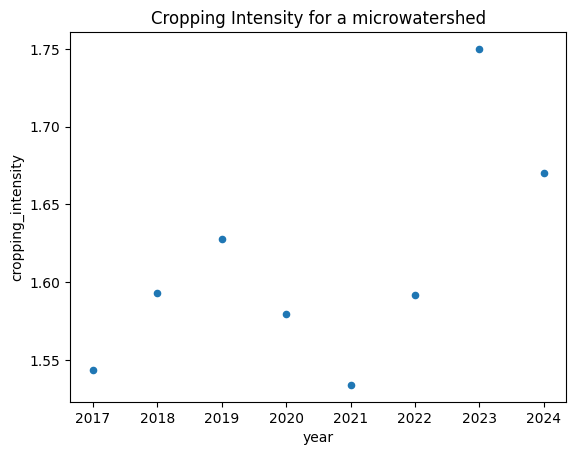

In [102]:
vector_data_mws_df.plot.scatter(x='year', y='cropping_intensity',title='Cropping Intensity for a microwatershed');